In [2]:
import pandas as pd
import geopandas as gpd
import json

In [35]:
points_data = gpd.read_file("data/all/points_data.geojson")

<Axes: >

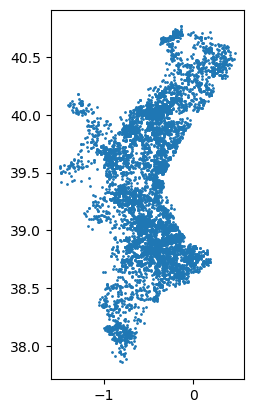

In [39]:
points_data.plot(markersize=1)

In [43]:
points_data_reduced = points_data[['altitud', 'pendiente', 'orientacion', 'n_CLAIFN', 'geometry']]

In [44]:
points_data_reduced

,altitud,pendiente,orientacion,n_CLAIFN,geometry
0,226.43176,1.512323,287.237460,200,POINT (-0.35770 38.91151)
1,591.98520,37.829388,174.613740,141,POINT (-0.49885 39.91551)
2,302.96150,57.214653,76.929750,111,POINT (-0.15506 40.12667)
3,365.60150,36.542430,112.896065,141,POINT (-0.10809 38.78970)
4,216.34225,48.399876,129.588600,140,POINT (-0.62135 39.06324)
...,...,...,...,...,...
9995,321.46176,58.597137,240.593480,121,POINT (-0.36823 39.69124)
9996,998.84950,23.794138,231.235290,171,POINT (-0.49897 38.73913)
9997,79.08550,39.971180,339.268550,300,POINT (-0.16729 38.92834)
9998,288.20276,34.997368,306.008120,111,POINT (-0.32392 38.88786)


In [45]:
# Save the reduced GeoJSON file
points_data_reduced.to_file('data/app/points_data_reduced.geojson', driver='GeoJSON')

In [7]:
# Read the Geopackage file
borderData = gpd.read_file('data/app/Delimitaciones.gpkg')

In [8]:
borderData

,id,cod_ine_ca,ca,area_ha,perimetro,geometry
0,,10,Comunitat Valenciana,2327182.49,1626316.9,"MULTIPOLYGON (((700333.860 4199432.290, 700332..."


In [19]:
borderData.to_crs('EPSG:4326', inplace=True)

In [20]:
borderData

,id,cod_ine_ca,ca,area_ha,perimetro,geometry
0,,10,Comunitat Valenciana,2327182.49,1626316.9,"MULTIPOLYGON (((-0.72083 37.92040, -0.72085 37..."


In [21]:
borderGeometry = borderData['geometry'].iloc[0]

In [22]:
borderGeometry

In [23]:
# Create a GeoDataFrame with the border geometry
borderGDF = gpd.GeoDataFrame(geometry=[borderGeometry])

In [24]:
borderGDF

,geometry
0,"MULTIPOLYGON (((-0.72083 37.92040, -0.72085 37..."


In [25]:
# Write the GeoJSON file
borderGDF.to_file('data/app/border.geojson', driver='GeoJSON')

In [27]:
# Read the original GeoJSON file
borderData = gpd.read_file('data/app/border.geojson')

# Simplify the geometry
tolerance = 0.001  # Adjust the tolerance value as needed
simplifiedBorder = borderData.simplify(tolerance)

# Save the simplified geometry to a new GeoJSON file
simplifiedBorder.to_file('data/app/simplified_border.geojson', driver='GeoJSON')


AttributeError: 'GeoDataFrame' object has no attribute 'simplify_preserve_topology'